# Instructions

Use any set of objects you want to extract.

Place them in a homogenous background.

Take a picture or two (that's your input image(s))

Extract the object using any or all of the Thresholding techniques you've known.

# Read in Images

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
file_path = '/content/drive/MyDrive/Colab Notebooks/GBCLessons/Machine Learning 2/Assignments/a5'
picks_1 = cv2.imread(file_path + '/picks1.png')

# Contour Segmentation

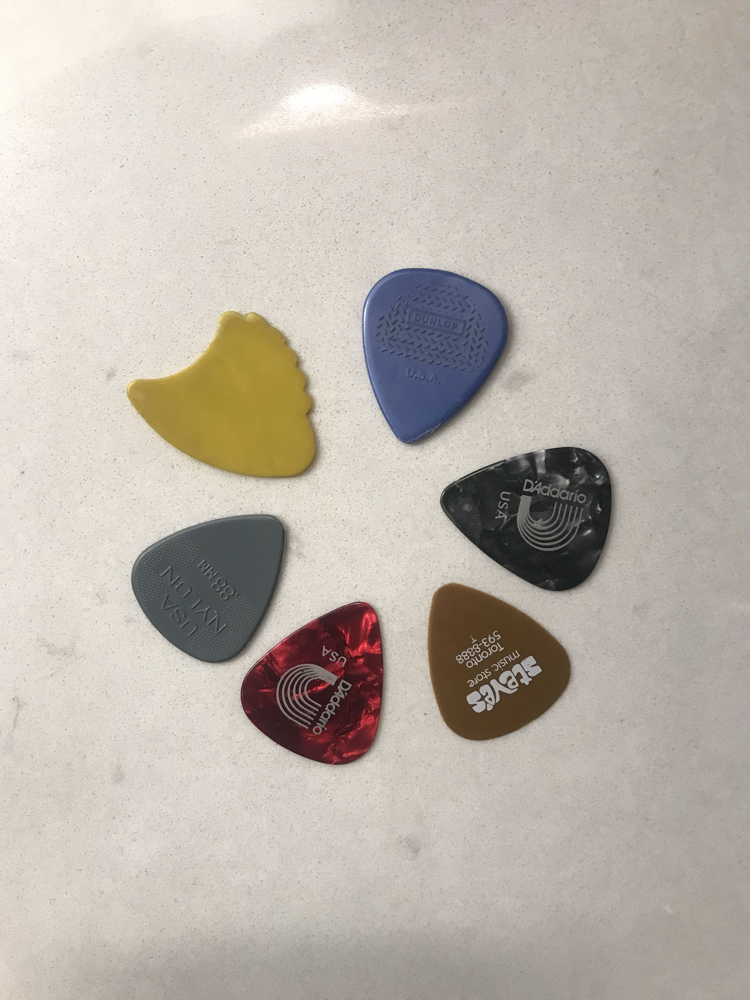

In [ ]:
cv2_imshow(picks_1)

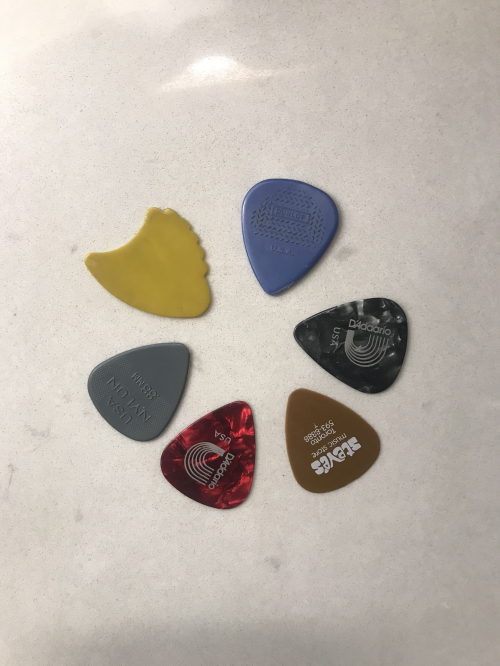

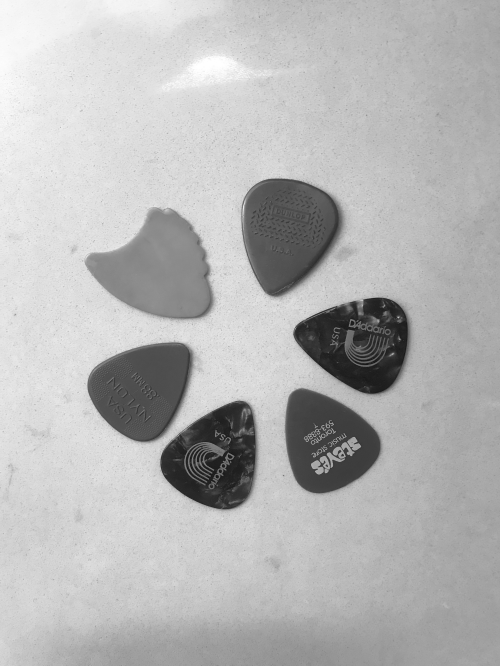

In [ ]:
# Rescale and blur image
r = 500.0 / picks_1.shape[1]
dim = (500, int(picks_1.shape[0] * r))
resized = cv2.resize(picks_1, dim, interpolation = cv2.INTER_AREA)
picks_1_gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
cv2_imshow(resized)
cv2_imshow(picks_1_gray)

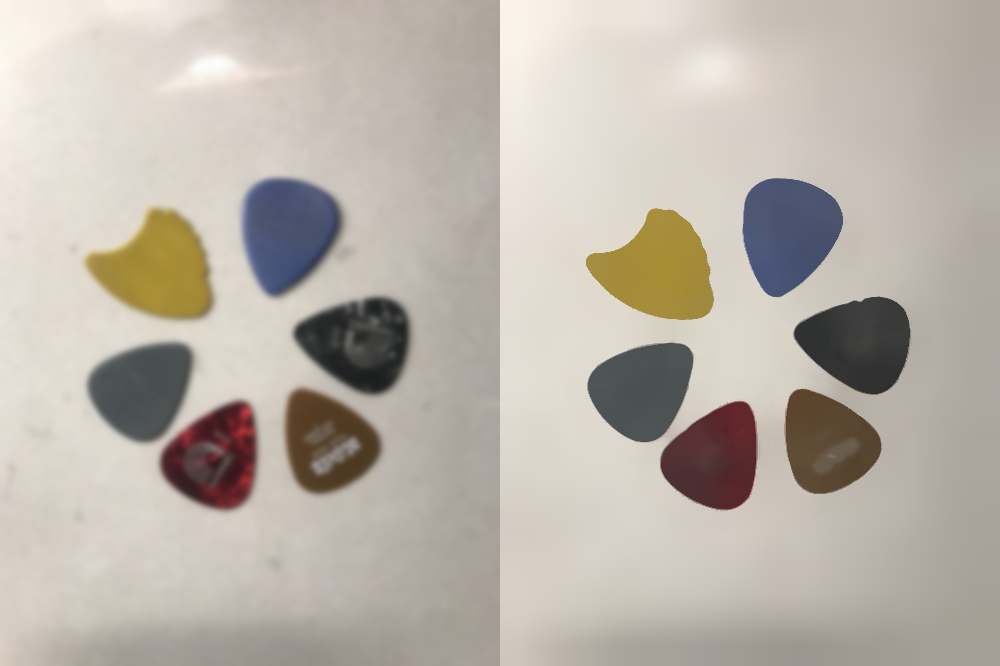

In [ ]:
gaussianblur = cv2.GaussianBlur(resized, (15, 15), 0)
shifted = cv2.pyrMeanShiftFiltering(gaussianblur, 20, 70)
cv2_imshow(np.hstack([gaussianblur, shifted]))

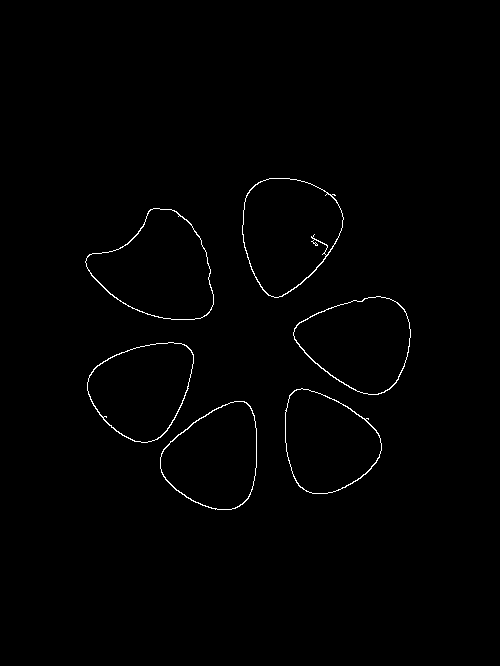

-1

In [ ]:
edged = cv2.Canny(shifted, 0, 150)
cv2_imshow(edged)
cv2.waitKey(0)

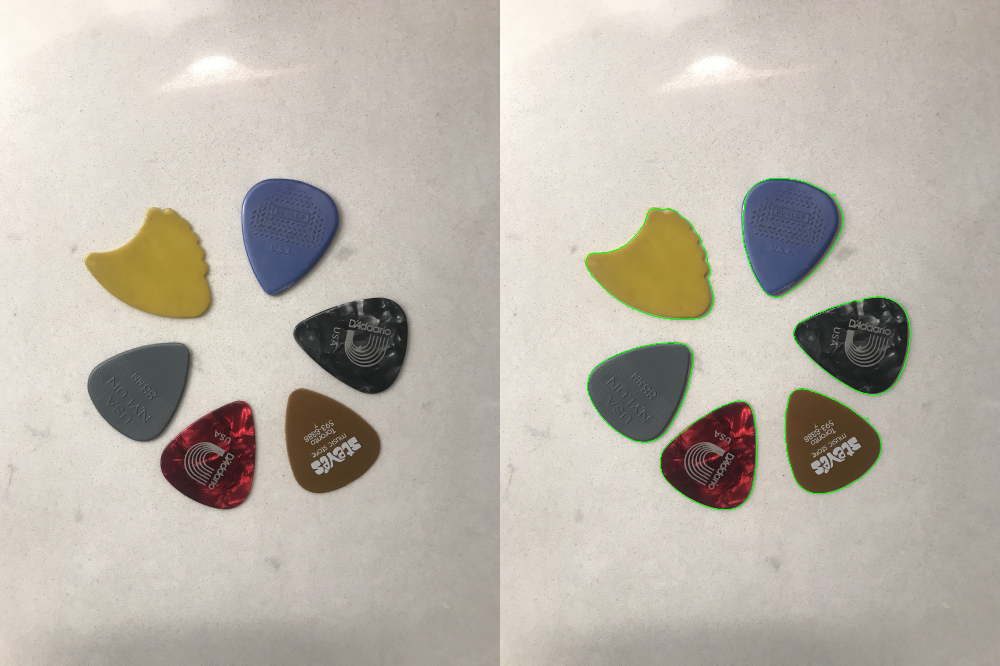

-1

In [ ]:
cnts, _ = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

resized_copy = resized.copy()
cv2.drawContours(resized_copy, cnts, -1, (0, 255, 0), 1)

cv2_imshow(np.hstack([resized, resized_copy]))
cv2.waitKey(0)

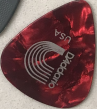

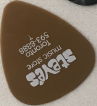

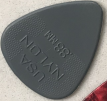

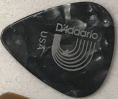

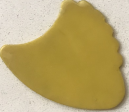

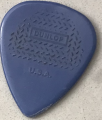

In [ ]:
cnt_copy = resized.copy()
for c in cnts:
  x,y,w,h = cv2.boundingRect(c)
  ROI = cnt_copy[y:y+h, x:x+w]
  cv2_imshow(ROI)

# Watershed Segmentation

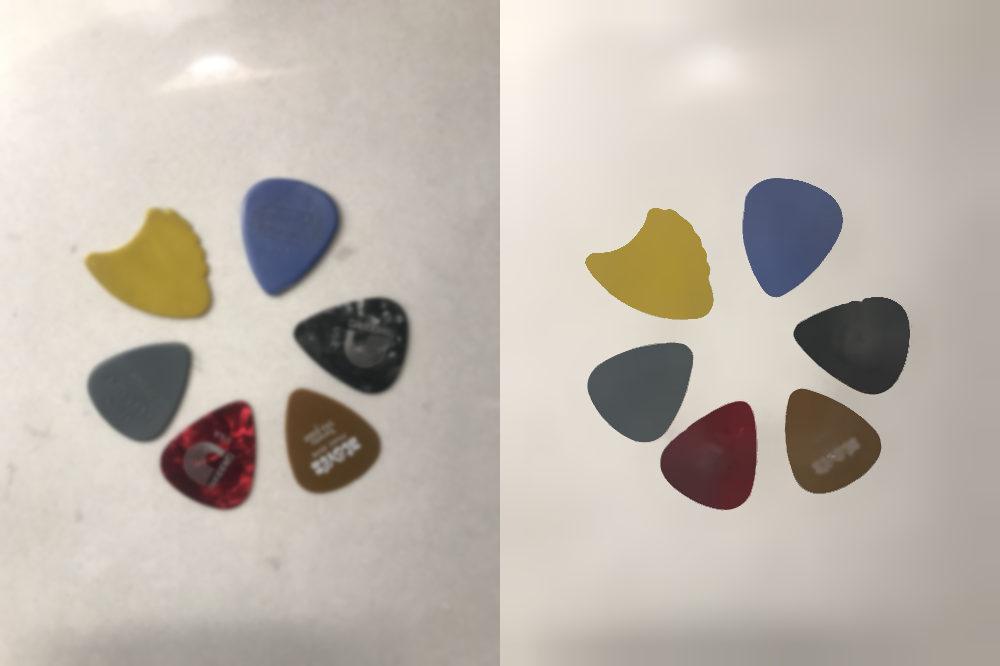

In [ ]:
from skimage.feature import peak_local_max
from skimage.morphology import watershed
from scipy import ndimage

picks_2 = cv2.imread(file_path + '/picks1.png')

# Rescale and blur image
r = 500.0 / picks_2.shape[1]
dim = (500, int(picks_2.shape[0] * r))
resized = cv2.resize(picks_2, dim, interpolation = cv2.INTER_AREA)
gaussianblur = cv2.GaussianBlur(resized, (9, 9), 0)

shifted = cv2.pyrMeanShiftFiltering(gaussianblur, 20, 70)
cv2_imshow(np.hstack([gaussianblur, shifted]))

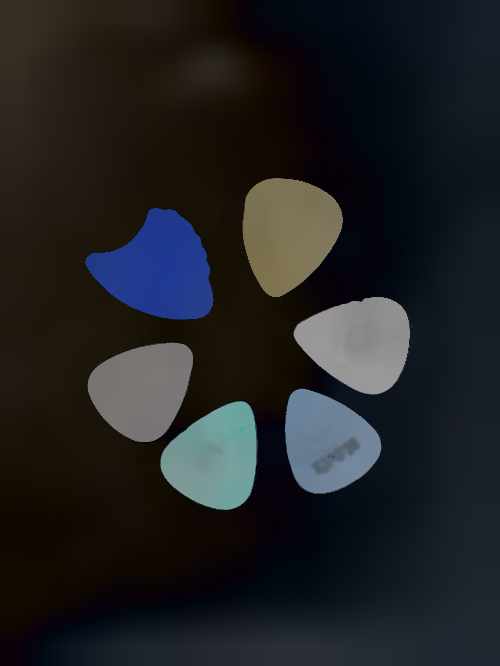

In [ ]:
# change contrast to improve selection
adjusted = cv2.convertScaleAbs(shifted, alpha=1.0, beta=-200)
cv2_imshow(adjusted)

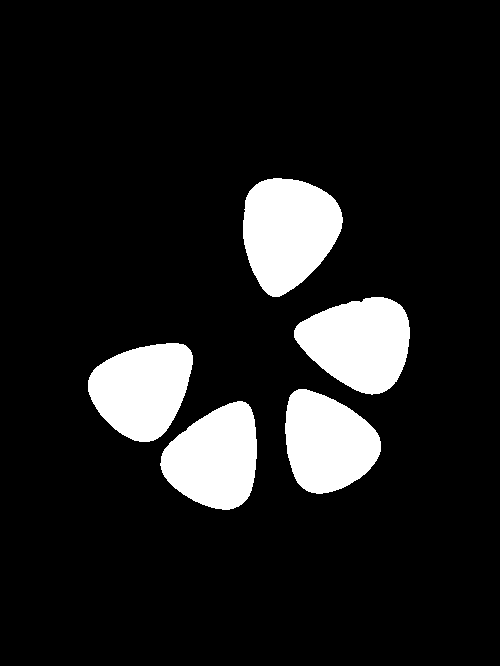

In [ ]:
picks_2_gray = cv2.cvtColor(adjusted, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(picks_2_gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
cv2_imshow(thresh)

In [ ]:
D = ndimage.distance_transform_edt(thresh)
localMax = peak_local_max(D, indices=False, min_distance=10,labels=thresh)
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-D, markers, mask = thresh)

len(np.unique(labels)) - 1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  
/usr/local/lib/python3.7/dist-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


5

In [ ]:
def grab_contours(cnts): 
    if len(cnts) == 2: 
        cnts = cnts[0]
    elif len(cnts) == 3:
        cnts = cnts[1]
    else:
        raise Exception(("Contours tuple must have length 2 or "
                        "3, otherwise OpenCV changed their cv2.findContours " 
                        "return signature yet again. "
                        "Refer to OpenCV’s documentation in that case."))
    return cnts

In [ ]:
res = resized.copy()

for label in np.unique(labels):
  if label == 0:
    continue
      
  mask = np.zeros(picks_2_gray.shape, dtype="uint8")
  mask[labels == label] = 255
  
  cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = grab_contours(cnts)
  c = max(cnts, key=cv2.contourArea)
  
  ((x, y), r) = cv2.minEnclosingCircle(c)
  cv2.circle(res, (int(x), int(y)), int(r), (0, 255, 0), 2)
  
  cv2.putText(res, "#{}".format(label), (int(x) - 10, int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

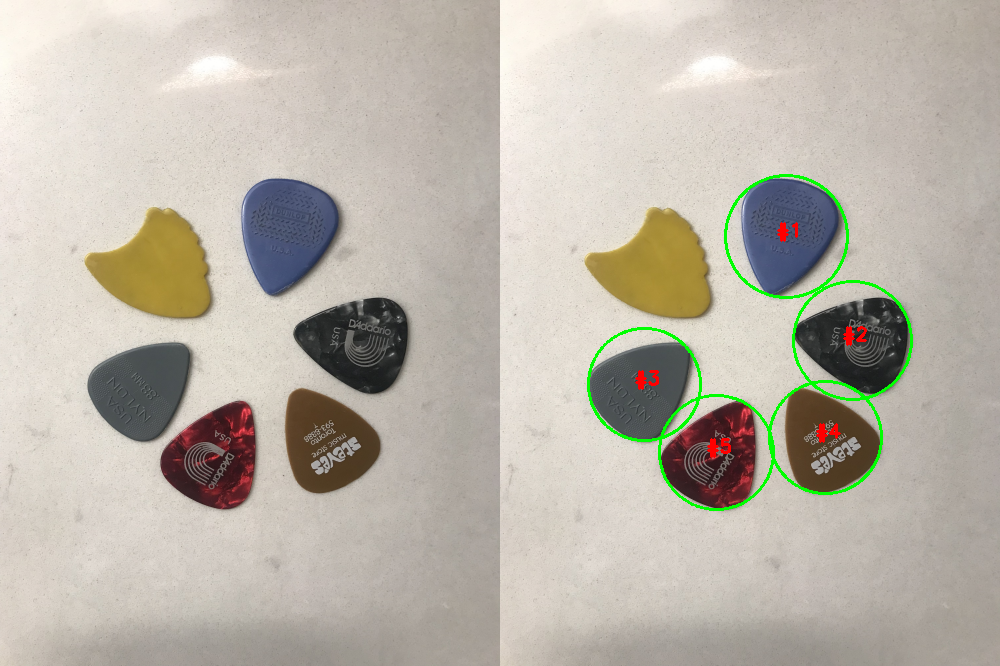

-1

In [ ]:
cv2_imshow(np.hstack([resized, res]))
cv2.waitKey(0)

Well, I've played around with this a lot, but I think we've learned a valuable lesson about taking pictures with high contrast.